# *_Metrics for porous material_*

### This proyect has as objective find metrics for sintetycal porous material, that is used like a replace of skin.

### We uses six images, three of them are a good samples, otherwise the other threes are bad samples

## 1) Importation <a class="anchor" id="first-bullet"></a>

importation of the six images
the good images and bad images are noted as g1,g2,g3,b1,b2,b3 respectly 

In [1]:
import numpy as np
import scipy 
import matplotlib.pyplot as plt
import porespy as ps
from PIL import Image
import imageio as io
import pandas as pd

Matplotlib is building the font cache; this may take a moment.


In [2]:
g1=io.imread('samples/Buena1.tif')
g2=io.imread('samples/Buena2.tif')
g3=io.imread('samples/Buena3.tif')
b1=io.imread('samples/Defecto1.tif')
b2=io.imread('samples/Defecto2.tif')
b3=io.imread('samples/Defecto3.tif')

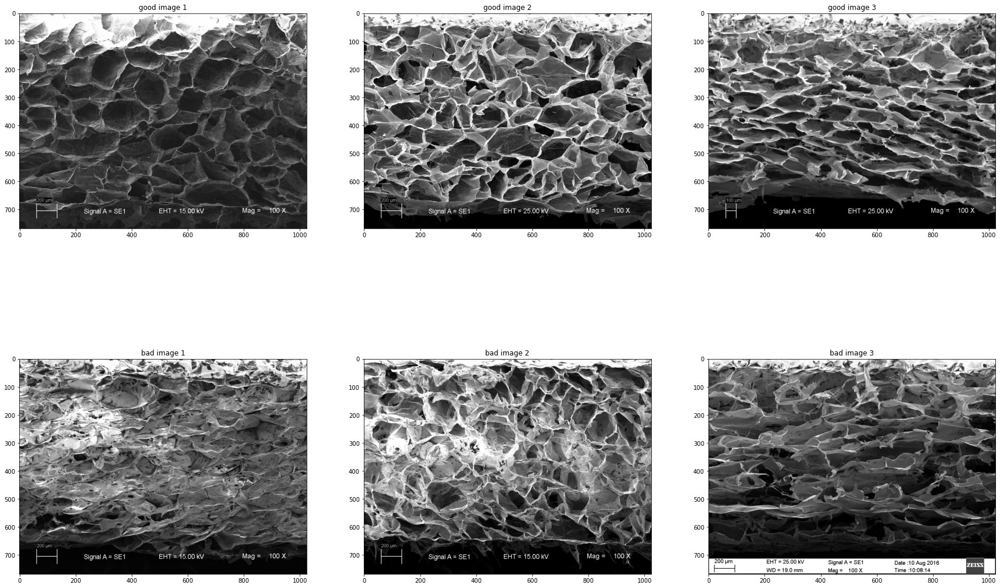

In [3]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1)
axs[0,0].set_title("good image 1")
axs[0,1].imshow(g2)
axs[0,1].set_title("good image 2")
axs[0,2].imshow(g3)
axs[0,2].set_title("good image 3")
axs[1,0].imshow(b1)
axs[1,0].set_title("bad image 1")
axs[1,1].imshow(b2)
axs[1,1].set_title("bad image 2")
axs[1,2].imshow(b3)
axs[1,2].set_title("bad image 3")

plt.show()

## 2) Filters

In [4]:
import cv2

In [5]:
g1.shape

(768, 1024, 3)

In [6]:
g1=g1[:,:,0]
g2=g2[:,:,0]
g3=g3[:,:,0]
b1=b1[:,:,0]
b2=b2[:,:,0]
b3=b3[:,:,0]

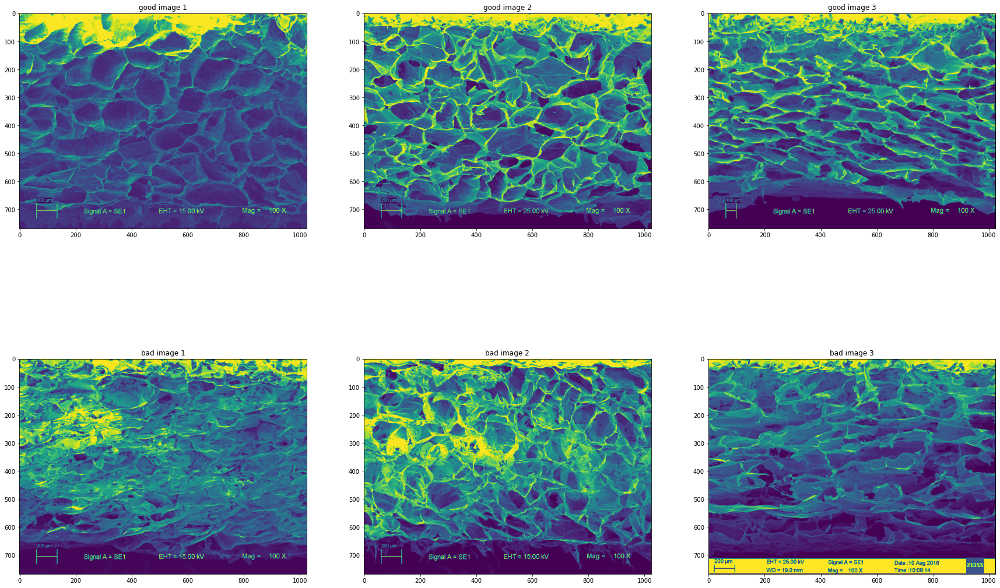

In [7]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1)
axs[0,0].set_title("good image 1")
axs[0,1].imshow(g2)
axs[0,1].set_title("good image 2")
axs[0,2].imshow(g3)
axs[0,2].set_title("good image 3")
axs[1,0].imshow(b1)
axs[1,0].set_title("bad image 1")
axs[1,1].imshow(b2)
axs[1,1].set_title("bad image 2")
axs[1,2].imshow(b3)
axs[1,2].set_title("bad image 3")

plt.show()

In [8]:
(thresh, g1b) = cv2.threshold(g1, 40, 255, cv2.THRESH_BINARY)
(thresh, g2b) = cv2.threshold(g2, 60, 255, cv2.THRESH_BINARY)
(thresh, g3b) = cv2.threshold(g3, 60, 255, cv2.THRESH_BINARY)
(thresh, b1b) = cv2.threshold(b1, 60, 255, cv2.THRESH_BINARY)
(thresh, b2b) = cv2.threshold(b2, 60, 255, cv2.THRESH_BINARY)
(thresh, b3b) = cv2.threshold(b3, 60, 255, cv2.THRESH_BINARY)

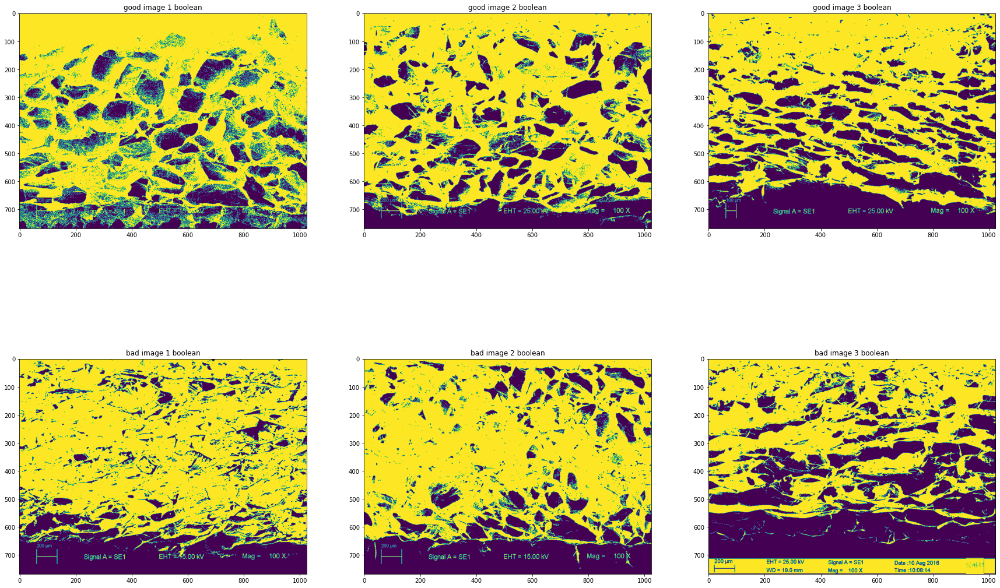

In [9]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1b)
axs[0,0].set_title("good image 1 boolean")
axs[0,1].imshow(g2b)
axs[0,1].set_title("good image 2 boolean")
axs[0,2].imshow(g3b)
axs[0,2].set_title("good image 3 boolean")
axs[1,0].imshow(b1b)
axs[1,0].set_title("bad image 1 boolean")
axs[1,1].imshow(b2b)
axs[1,1].set_title("bad image 2 boolean")
axs[1,2].imshow(b3b)
axs[1,2].set_title("bad image 3 boolean")

plt.show()

### Porosimetry filter <a class="anchor" id="second-bullet"></a>

In [10]:
g1p=ps.filters.porosimetry(g1b, access_limited=False)
g2p=ps.filters.porosimetry(g2b, access_limited=False)
g3p=ps.filters.porosimetry(g3b, access_limited=False)
b1p=ps.filters.porosimetry(b1b, access_limited=False)
b2p=ps.filters.porosimetry(b2b, access_limited=False)
b3p=ps.filters.porosimetry(b3b, access_limited=False)


100%|██████████| 25/25 [00:00<00:00, 25.70it/s]


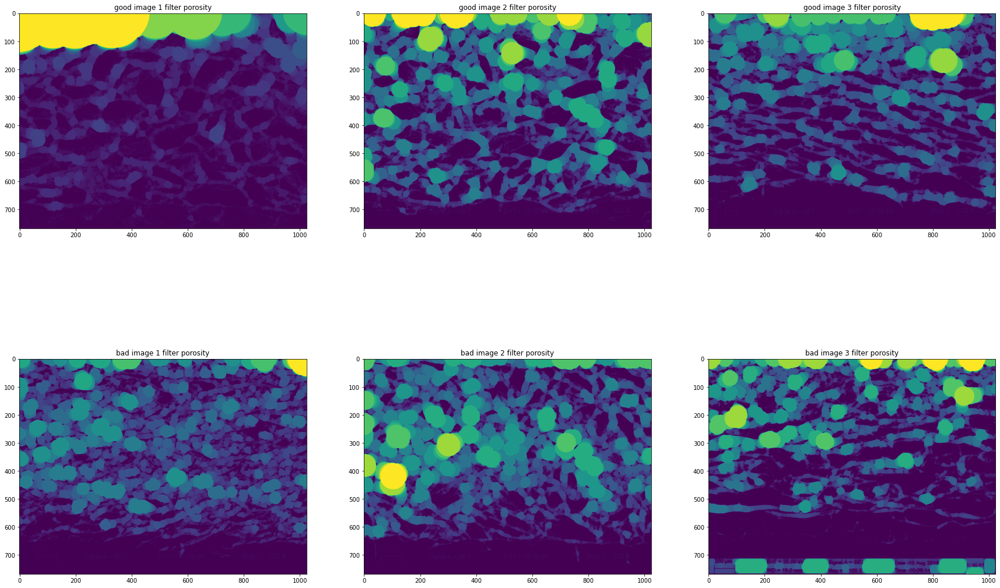

In [11]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1p)
axs[0,0].set_title("good image 1 filter porosity")
axs[0,1].imshow(g2p)
axs[0,1].set_title("good image 2 filter porosity")
axs[0,2].imshow(g3p)
axs[0,2].set_title("good image 3 filter porosity")
axs[1,0].imshow(b1p)
axs[1,0].set_title("bad image 1 filter porosity")
axs[1,1].imshow(b2p)
axs[1,1].set_title("bad image 2 filter porosity")
axs[1,2].imshow(b3p)
axs[1,2].set_title("bad image 3 filter porosity")

plt.show()

In [12]:
g1d= ps.metrics.pore_size_distribution(g1p)
g2d= ps.metrics.pore_size_distribution(g2p)
g3d= ps.metrics.pore_size_distribution(g3p)
b1d= ps.metrics.pore_size_distribution(b1p)
b2d= ps.metrics.pore_size_distribution(b2p)
b3d= ps.metrics.pore_size_distribution(b3p)

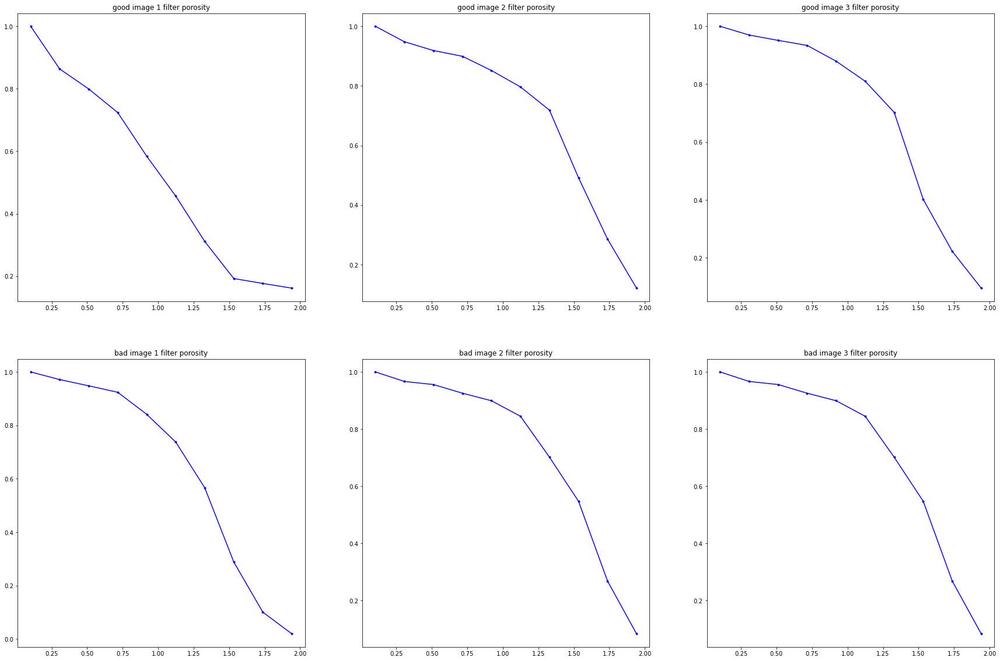

In [13]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].plot(g1d.logR, g1d.cdf, 'b.-', label='mip')
axs[0,0].set_title("good image 1 filter porosity")
axs[0,1].plot(g1d.logR, g2d.cdf, 'b.-', label='mip')
axs[0,1].set_title("good image 2 filter porosity")
axs[0,2].plot(g1d.logR, g3d.cdf, 'b.-', label='mip')
axs[0,2].set_title("good image 3 filter porosity")
axs[1,0].plot(g1d.logR, b1d.cdf, 'b.-', label='mip')
axs[1,0].set_title("bad image 1 filter porosity")
axs[1,1].plot(g1d.logR, b2d.cdf, 'b.-', label='mip')
axs[1,1].set_title("bad image 2 filter porosity")
axs[1,2].plot(g1d.logR, b2d.cdf, 'b.-', label='mip')
axs[1,2].set_title("bad image 3 filter porosity")

plt.show()

### fftMorphology filter

In [14]:
from skimage.morphology import disk

In [15]:
g1fm1=ps.filters.fftmorphology(g1b,strel=disk(1), mode='dilation')
g1fm2=ps.filters.fftmorphology(g1b,strel=disk(1), mode='erosion')
g1fm3=ps.filters.fftmorphology(g1b,strel=disk(1), mode='opening')
g1fm4=ps.filters.fftmorphology(g1b,strel=disk(1), mode='closing')

g2p=ps.filters.fftmorphology(g2b,strel=disk(1), mode='opening')
g3p=ps.filters.fftmorphology(g3b,strel=disk(1), mode='opening')
b1p=ps.filters.fftmorphology(b1b,strel=disk(1), mode='opening')
b2p=ps.filters.fftmorphology(b2b,strel=disk(1), mode='opening')
b3p=ps.filters.fftmorphology(b3b,strel=disk(1), mode='opening')

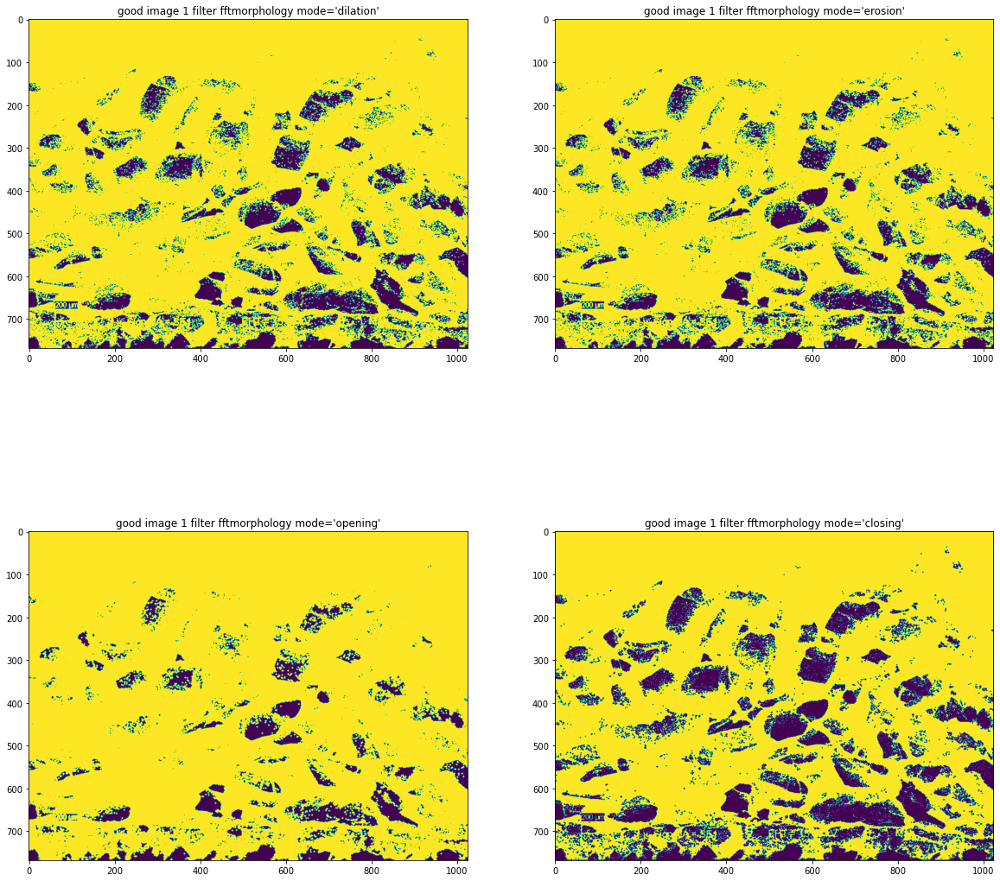

In [16]:
fig, axs = plt.subplots(2, 2,figsize=(20,20))
axs[0,0].imshow(g1fm1)
axs[0,0].set_title("good image 1 filter fftmorphology mode='dilation'")
axs[0,1].imshow(g1fm2)
axs[0,1].set_title("good image 1 filter fftmorphology mode='erosion'")
axs[1,0].imshow(g1fm3)
axs[1,0].set_title("good image 1 filter fftmorphology mode='opening'")
axs[1,1].imshow(g1fm4)
axs[1,1].set_title("good image 1 filter fftmorphology mode='closing'")
plt.show()

In [17]:
g2fm1=ps.filters.fftmorphology(g2b,strel=disk(1), mode='dilation')
g2fm2=ps.filters.fftmorphology(g2b,strel=disk(1), mode='erosion')
g2fm3=ps.filters.fftmorphology(g2b,strel=disk(1), mode='opening')
g2fm4=ps.filters.fftmorphology(g2b,strel=disk(1), mode='closing')

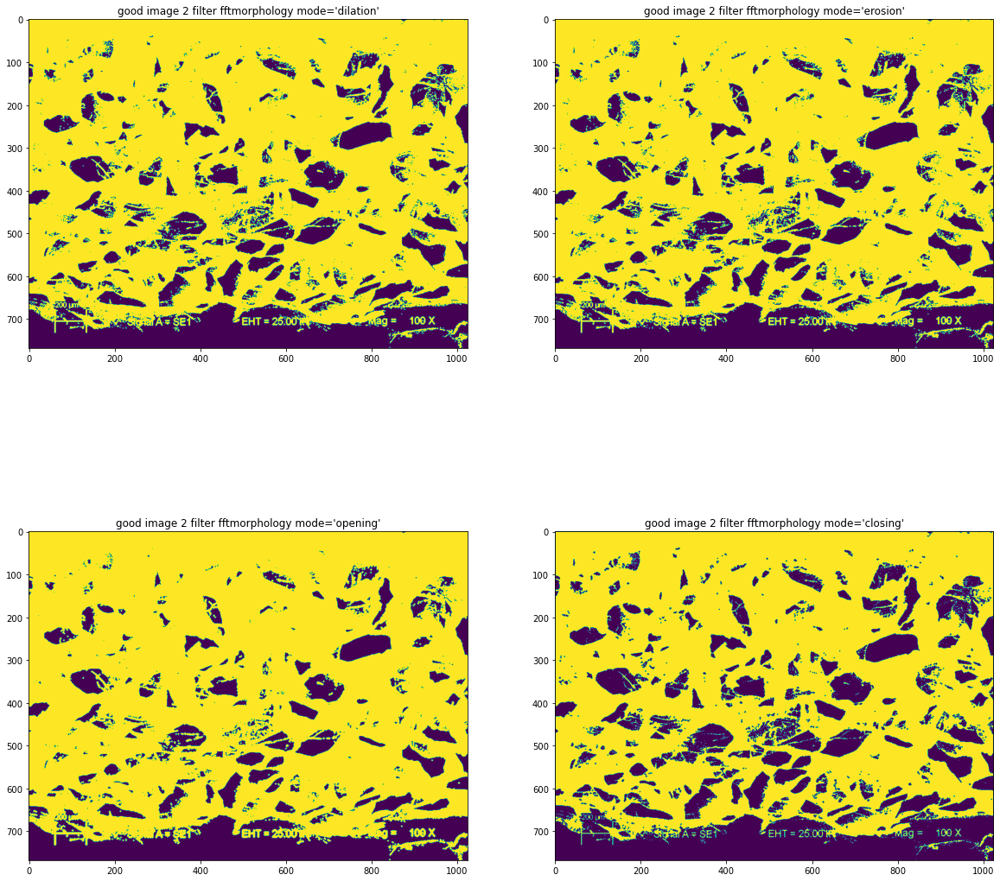

In [18]:
fig, axs = plt.subplots(2, 2,figsize=(20,20))
axs[0,0].imshow(g2fm1)
axs[0,0].set_title("good image 2 filter fftmorphology mode='dilation'")
axs[0,1].imshow(g2fm2)
axs[0,1].set_title("good image 2 filter fftmorphology mode='erosion'")
axs[1,0].imshow(g2fm3)
axs[1,0].set_title("good image 2 filter fftmorphology mode='opening'")
axs[1,1].imshow(g2fm4)
axs[1,1].set_title("good image 2 filter fftmorphology mode='closing'")
plt.show()

In [19]:
g3fm1=ps.filters.fftmorphology(g3b,strel=disk(1), mode='dilation')
g3fm2=ps.filters.fftmorphology(g3b,strel=disk(1), mode='erosion')
g3fm3=ps.filters.fftmorphology(g3b,strel=disk(1), mode='opening')
g3fm4=ps.filters.fftmorphology(g3b,strel=disk(1), mode='closing')

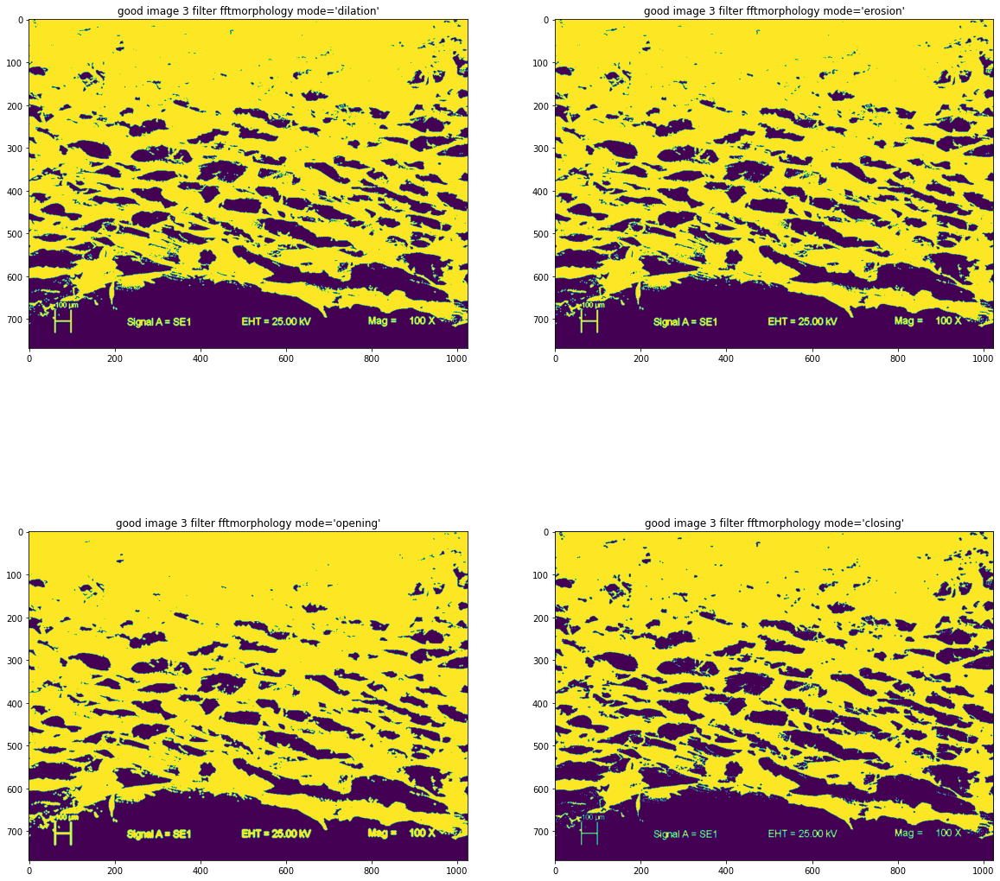

In [20]:
fig, axs = plt.subplots(2, 2,figsize=(20,20))
axs[0,0].imshow(g3fm1)
axs[0,0].set_title("good image 3 filter fftmorphology mode='dilation'")
axs[0,1].imshow(g3fm2)
axs[0,1].set_title("good image 3 filter fftmorphology mode='erosion'")
axs[1,0].imshow(g3fm3)
axs[1,0].set_title("good image 3 filter fftmorphology mode='opening'")
axs[1,1].imshow(g3fm4)
axs[1,1].set_title("good image 3 filter fftmorphology mode='closing'")
plt.show()

In [21]:
b1fm1=ps.filters.fftmorphology(b1b,strel=disk(1), mode='dilation')
b1fm2=ps.filters.fftmorphology(b1b,strel=disk(1), mode='erosion')
b1fm3=ps.filters.fftmorphology(b1b,strel=disk(1), mode='opening')
b1fm4=ps.filters.fftmorphology(b1b,strel=disk(1), mode='closing')

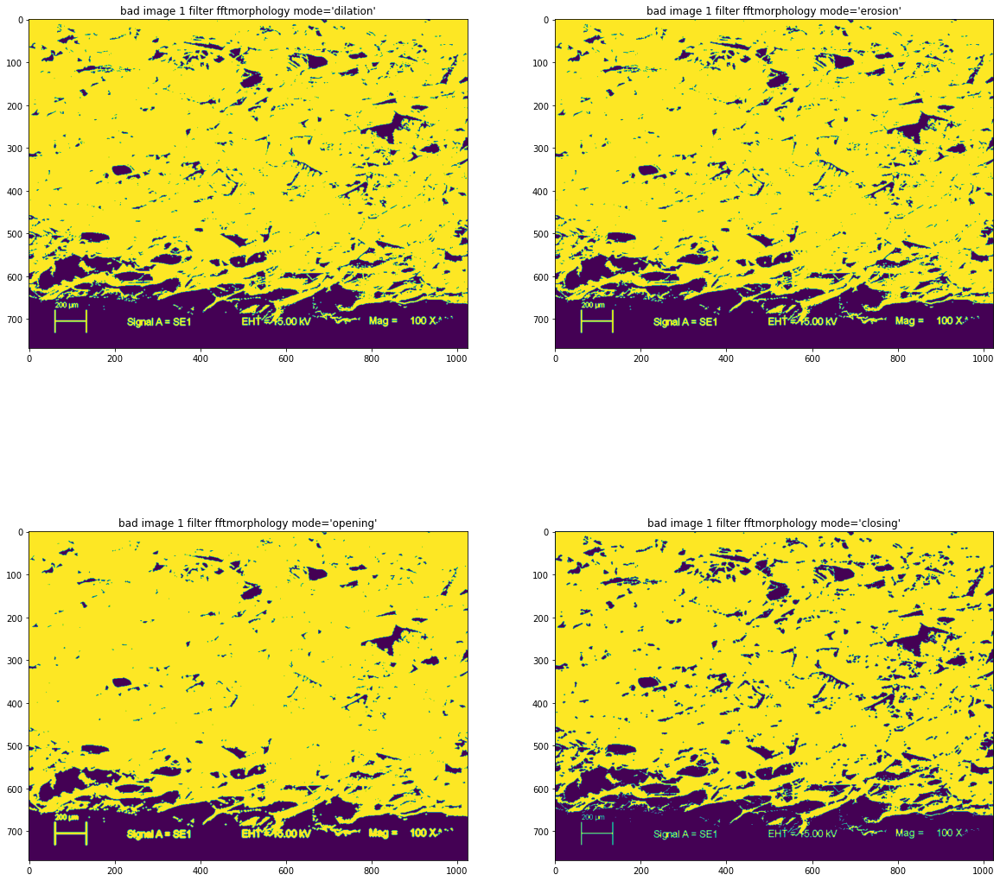

In [22]:
fig, axs = plt.subplots(2, 2,figsize=(20,20))
axs[0,0].imshow(b1fm1)
axs[0,0].set_title("bad image 1 filter fftmorphology mode='dilation'")
axs[0,1].imshow(b1fm2)
axs[0,1].set_title("bad image 1 filter fftmorphology mode='erosion'")
axs[1,0].imshow(b1fm3)
axs[1,0].set_title("bad image 1 filter fftmorphology mode='opening'")
axs[1,1].imshow(b1fm4)
axs[1,1].set_title("bad image 1 filter fftmorphology mode='closing'")
plt.show()

In [23]:
b2fm1=ps.filters.fftmorphology(b2b,strel=disk(1), mode='dilation')
b2fm2=ps.filters.fftmorphology(b2b,strel=disk(1), mode='erosion')
b2fm3=ps.filters.fftmorphology(b2b,strel=disk(1), mode='opening')
b2fm4=ps.filters.fftmorphology(b2b,strel=disk(1), mode='closing')

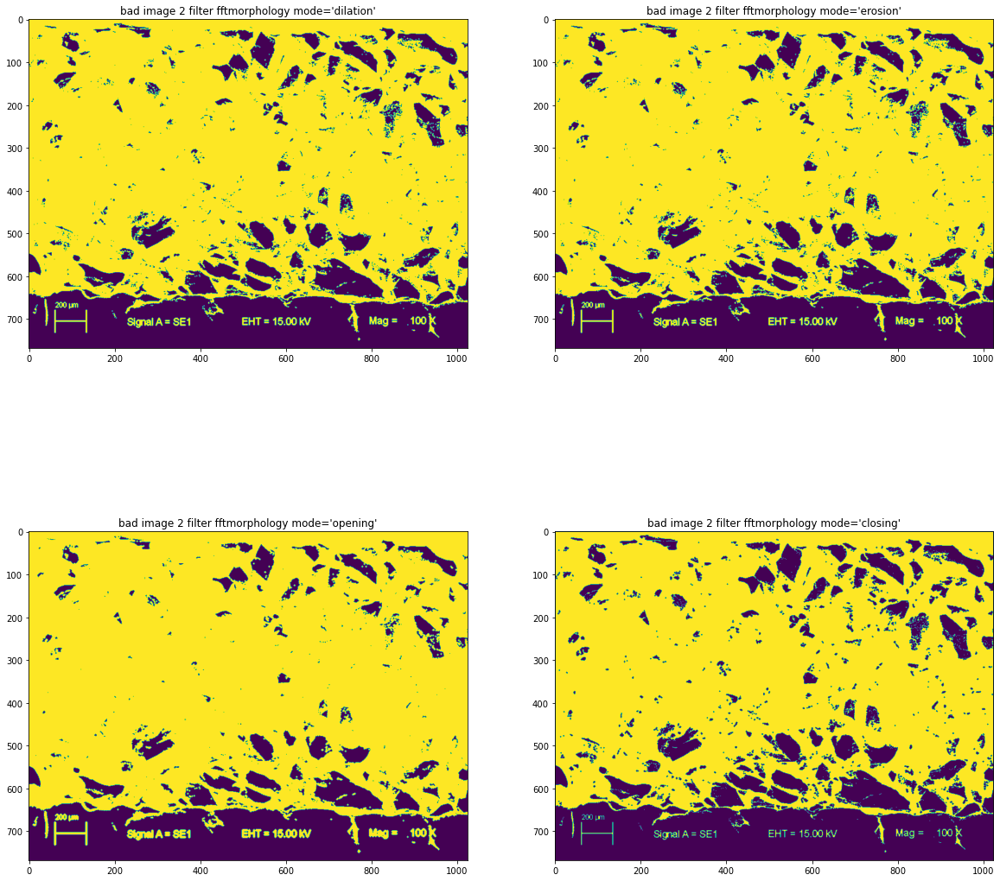

In [24]:
fig, axs = plt.subplots(2, 2,figsize=(20,20))
axs[0,0].imshow(b2fm1)
axs[0,0].set_title("bad image 2 filter fftmorphology mode='dilation'")
axs[0,1].imshow(b2fm2)
axs[0,1].set_title("bad image 2 filter fftmorphology mode='erosion'")
axs[1,0].imshow(b2fm3)
axs[1,0].set_title("bad image 2 filter fftmorphology mode='opening'")
axs[1,1].imshow(b2fm4)
axs[1,1].set_title("bad image 2 filter fftmorphology mode='closing'")
plt.show()

In [25]:
b3fm1=ps.filters.fftmorphology(b3b,strel=disk(1), mode='dilation')
b3fm2=ps.filters.fftmorphology(b3b,strel=disk(1), mode='erosion')
b3fm3=ps.filters.fftmorphology(b3b,strel=disk(1), mode='opening')
b3fm4=ps.filters.fftmorphology(b3b,strel=disk(1), mode='closing')

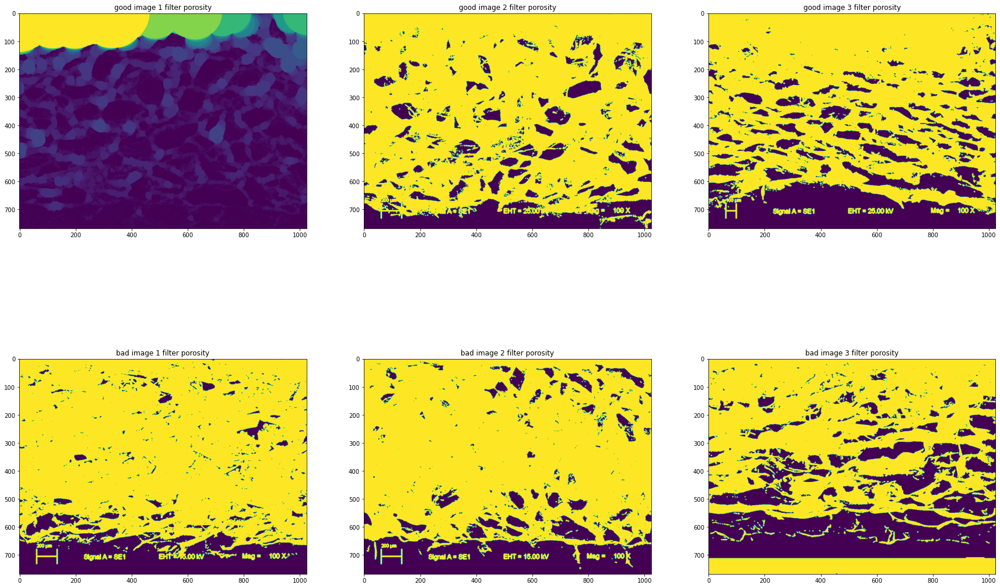

In [26]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1p)
axs[0,0].set_title("good image 1 filter porosity")
axs[0,1].imshow(g2p)
axs[0,1].set_title("good image 2 filter porosity")
axs[0,2].imshow(g3p)
axs[0,2].set_title("good image 3 filter porosity")
axs[1,0].imshow(b1p)
axs[1,0].set_title("bad image 1 filter porosity")
axs[1,1].imshow(b2p)
axs[1,1].set_title("bad image 2 filter porosity")
axs[1,2].imshow(b3p)
axs[1,2].set_title("bad image 3 filter porosity")

plt.show()

### Fill blind pores filter

In [27]:
g1fb=ps.filters.fill_blind_pores(g1b)
g2fb=ps.filters.fill_blind_pores(g2b)
g3fb=ps.filters.fill_blind_pores(g3b)
b1fb=ps.filters.fill_blind_pores(b1b)
b2fb=ps.filters.fill_blind_pores(b2b)
b3fb=ps.filters.fill_blind_pores(b3b)


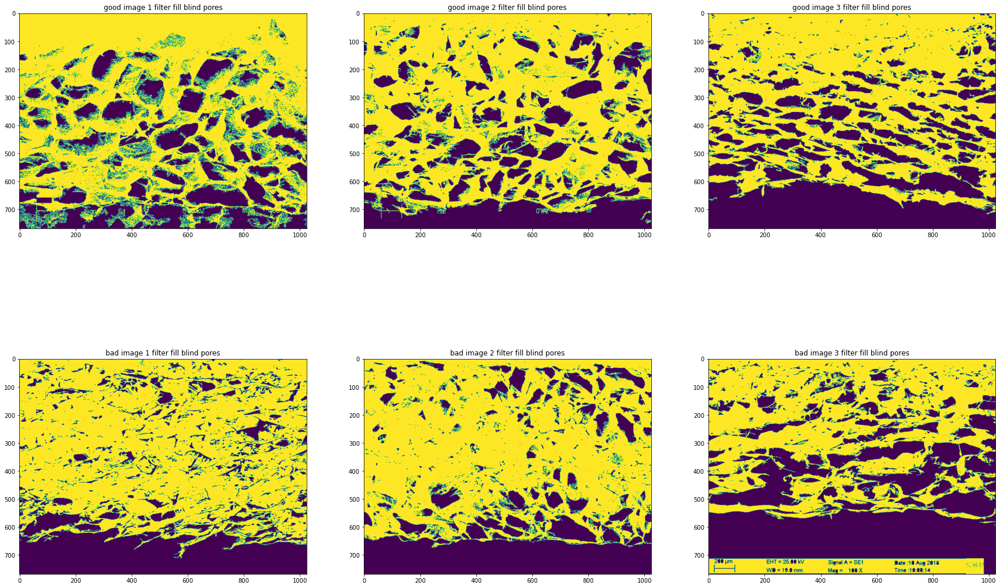

In [28]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].imshow(g1fb)
axs[0,0].set_title("good image 1 filter fill blind pores")
axs[0,1].imshow(g2fb)
axs[0,1].set_title("good image 2 filter fill blind pores")
axs[0,2].imshow(g3fb)
axs[0,2].set_title("good image 3 filter fill blind pores")
axs[1,0].imshow(b1fb)
axs[1,0].set_title("bad image 1 filter fill blind pores")
axs[1,1].imshow(b2fb)
axs[1,1].set_title("bad image 2 filter fill blind pores")
axs[1,2].imshow(b3fb)
axs[1,2].set_title("bad image 3 filter fill blind pores")

plt.show()

## 3) Metrics

### Porosity profile

In [29]:
g1x = ps.metrics.porosity_profile(g1b, 0)
g1y = ps.metrics.porosity_profile(g1b, 1)
g2x = ps.metrics.porosity_profile(g2b, 0)
g2y = ps.metrics.porosity_profile(g2b, 1)
g3x = ps.metrics.porosity_profile(g3b, 0)
g3y = ps.metrics.porosity_profile(g3b, 1)
b1x = ps.metrics.porosity_profile(b1b, 0)
b1y = ps.metrics.porosity_profile(b1b, 1)
b2x = ps.metrics.porosity_profile(b2b, 0)
b2y = ps.metrics.porosity_profile(b2b, 1)
b3x = ps.metrics.porosity_profile(b3b, 0)
b3y = ps.metrics.porosity_profile(b3b, 1)

In [30]:
import scipy as sp


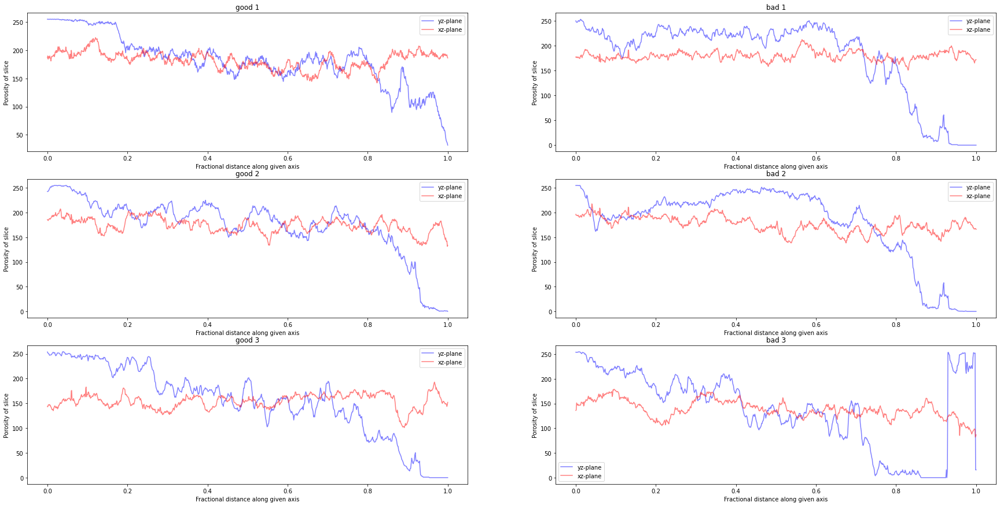

In [31]:
fig, axs = plt.subplots(3, 2,figsize=(30,15))

axs[0,0].plot(np.linspace(0, 1, g1b.shape[0]), g1x, 'b-', label='yz-plane', alpha=0.5)
axs[0,0].plot(np.linspace(0, 1, g1b.shape[1], g1b.shape[1]), g1y, 'r-', label='xz-plane', alpha=0.5)
axs[0,0].set_ylabel('Porosity of slice')
axs[0,0].set_xlabel('Fractional distance along given axis')
axs[0,0].set_title('good 1')
axs[0,0].legend()

axs[1,0].plot(np.linspace(0, 1, g2b.shape[0]), g2x, 'b-', label='yz-plane', alpha=0.5)
axs[1,0].plot(np.linspace(0, 1, g2b.shape[1], g2b.shape[1]), g2y, 'r-', label='xz-plane', alpha=0.5)
axs[1,0].set_ylabel('Porosity of slice')
axs[1,0].set_xlabel('Fractional distance along given axis')
axs[1,0].set_title('good 2')
axs[1,0].legend()

axs[2,0].plot(np.linspace(0, 1, g3b.shape[0]), g3x, 'b-', label='yz-plane', alpha=0.5)
axs[2,0].plot(np.linspace(0, 1, g3b.shape[1], g3b.shape[1]), g3y, 'r-', label='xz-plane', alpha=0.5)
axs[2,0].set_ylabel('Porosity of slice')
axs[2,0].set_xlabel('Fractional distance along given axis')
axs[2,0].set_title('good 3')
axs[2,0].legend()

axs[0,1].plot(np.linspace(0, 1, b1b.shape[0]), b1x, 'b-', label='yz-plane', alpha=0.5)
axs[0,1].plot(np.linspace(0, 1, b1b.shape[1], b1b.shape[1]), b1y, 'r-', label='xz-plane', alpha=0.5)
axs[0,1].set_ylabel('Porosity of slice')
axs[0,1].set_xlabel('Fractional distance along given axis')
axs[0,1].set_title('bad 1')
axs[0,1].legend()

axs[1,1].plot(np.linspace(0, 1, b2b.shape[0]), b2x, 'b-', label='yz-plane', alpha=0.5)
axs[1,1].plot(np.linspace(0, 1, b2b.shape[1], b2b.shape[1]), b2y, 'r-', label='xz-plane', alpha=0.5)
axs[1,1].set_ylabel('Porosity of slice')
axs[1,1].set_xlabel('Fractional distance along given axis')
axs[1,1].set_title('bad 2')
axs[1,1].legend()

axs[2,1].plot(np.linspace(0, 1, b3b.shape[0]), b3x, 'b-', label='yz-plane', alpha=0.5)
axs[2,1].plot(np.linspace(0, 1, b3b.shape[1], b3b.shape[1]), b3y, 'r-', label='xz-plane', alpha=0.5)
axs[2,1].set_ylabel('Porosity of slice')
axs[2,1].set_xlabel('Fractional distance along given axis')
axs[2,1].set_title('bad 3')
axs[2,1].legend()

plt.show()

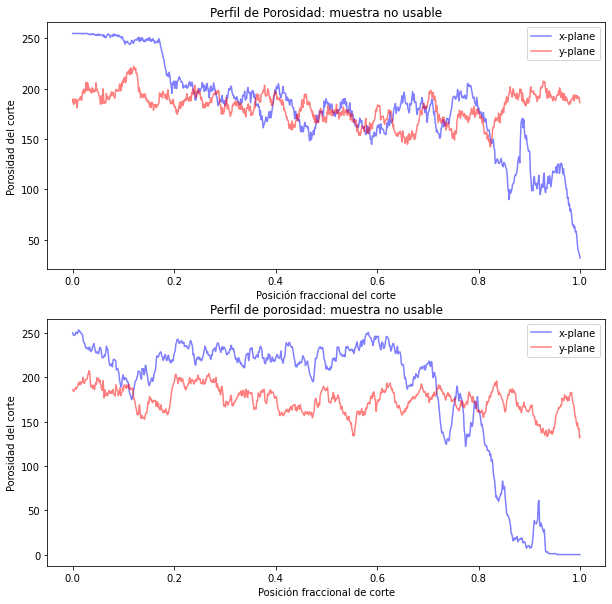

In [32]:
fig, axs = plt.subplots(2, 1,figsize=(10,10))

axs[0].plot(np.linspace(0, 1, g1b.shape[0]), g1x, 'b-', label='x-plane', alpha=0.5)
axs[0].plot(np.linspace(0, 1, g1b.shape[1], g1b.shape[1]), g1y, 'r-', label='y-plane', alpha=0.5)
axs[0].set_ylabel('Porosidad del corte')
axs[0].set_xlabel('Posición fraccional del corte')
axs[0].set_title('Perfil de Porosidad: muestra no usable')
axs[0].legend()

axs[1].plot(np.linspace(0, 1, b1b.shape[0]), b1x, 'b-', label='x-plane', alpha=0.5)
axs[1].plot(np.linspace(0, 1, b1b.shape[1], b1b.shape[1]), g2y, 'r-', label='y-plane', alpha=0.5)
axs[1].set_ylabel('Porosidad del corte')
axs[1].set_xlabel('Posición fraccional de corte')
axs[1].set_title('Perfil de porosidad: muestra no usable')
axs[1].legend()

plt.show()

fig.savefig('/home/daniela/graph.png')

### Pore size distribution

In [33]:
g1m_ps= ps.metrics.pore_size_distribution(g1p)
g2m_ps= ps.metrics.pore_size_distribution(g2p)
g3m_ps= ps.metrics.pore_size_distribution(g3p)
b1m_ps= ps.metrics.pore_size_distribution(b1p)
b2m_ps= ps.metrics.pore_size_distribution(b2p)
b3m_ps= ps.metrics.pore_size_distribution(b3p)

In [34]:
g2m_ps.cdf


array([1., 1., 1., 1., 1., 1., 0., 0., 0., 0.])

In [35]:
b1m_ps.satn

array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.])

<BarContainer object of 10 artists>

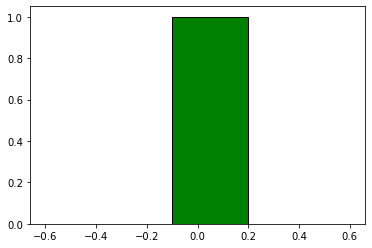

In [36]:
plt.bar(b1m_ps.logR, b1m_ps.satn, width=0.3,edgecolor='k',color='g')

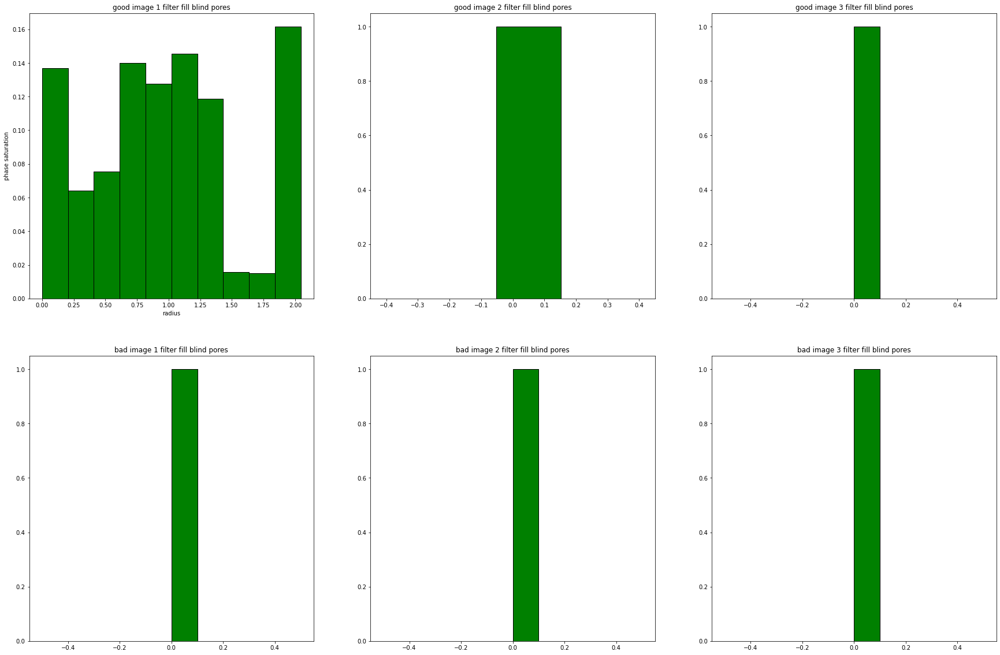

In [37]:
fig, axs = plt.subplots(2, 3,figsize=(30,20))
axs[0,0].bar(g1m_ps.logR, g1m_ps.satn, width=g1m_ps.bin_widths, edgecolor='k',color='g')
axs[0,0].set_title("good image 1 filter fill blind pores")
axs[0,0].set_xlabel('radius')
axs[0,0].set_ylabel('phase saturation')
axs[0,1].bar(g2m_ps.logR, g2m_ps.satn, width=g1m_ps.bin_widths, edgecolor='k',color='g')
axs[0,1].set_xlim([-0.45,0.45])
axs[0,1].set_title("good image 2 filter fill blind pores")
axs[0,2].bar(g3m_ps.logR, g3m_ps.satn, width=g3m_ps.bin_widths, edgecolor='k',color='g')
axs[0,2].set_title("good image 3 filter fill blind pores")
axs[1,0].bar(b1m_ps.logR, b1m_ps.satn, width=b1m_ps.bin_widths, edgecolor='k',color='g')
axs[1,0].set_title("bad image 1 filter fill blind pores")
axs[1,1].bar(b3m_ps.logR, b2m_ps.satn, width=b2m_ps.bin_widths, edgecolor='k',color='g')
axs[1,1].set_title("bad image 2 filter fill blind pores")
axs[1,2].bar(b3m_ps.logR, b3m_ps.satn, width=b3m_ps.bin_widths, edgecolor='k',color='g')
axs[1,2].set_title("bad image 3 filter fill blind pores")

plt.show()

### Feret diameter

In [38]:
from skimage.measure import label, regionprops, regionprops_table, find_contours
import math

In [39]:
lg1=label(g1b)
lg2=label(g2b)
lg3=label(g3b)
lb1=label(b1b)
lb2=label(b2b)
lb3=label(b3b)

rg1=regionprops(g1b)
rg2=regionprops(g2b)
rg3=regionprops(g3b)
rb1=regionprops(b1b)
rb2=regionprops(b2b)
rb3=regionprops(b3b)

fg1=find_contours(g1b,level=0.8)
fg2=find_contours(g2b,level=0.8)
fg3=find_contours(g3b,level=0.8)
fb1=find_contours(b1b,level=0.8)
fb2=find_contours(b2b,level=0.8)
fb3=find_contours(b3b,level=0.8)

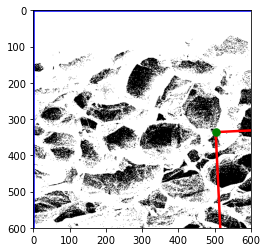

In [40]:
fig, ax = plt.subplots()
ax.imshow(g1b, cmap=plt.cm.gray)

for props in rg1:
    y0, x0 = props.centroid
    orientation = props.orientation
    x1 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
    x2 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=15)

    minr, minc, maxr, maxc = props.bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-b', linewidth=2.5)

ax.axis((0, 600, 600, 0))
plt.show()

In [41]:
pg1=regionprops_table(lg1,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))
pg2=regionprops_table(lg2,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))
pg3=regionprops_table(lg3,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))
pb1=regionprops_table(lb1,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))
pb2=regionprops_table(lb2,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))
pb3=regionprops_table(lb3,properties=('centroid',
                                                 'orientation',
                                                 'major_axis_length',
                                                 'minor_axis_length'))

In [42]:
pd.DataFrame(pg1)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,330.008314,503.232888,-1.522200,1207.373760,858.206168
1,47.000000,911.000000,0.785398,0.000000,0.000000
2,49.000000,914.000000,0.785398,0.000000,0.000000
3,80.166667,933.500000,-1.148719,4.057454,2.399852
4,80.000000,930.000000,0.785398,0.000000,0.000000
...,...,...,...,...,...
5629,767.000000,428.000000,1.570796,3.265986,0.000000
5630,767.000000,446.000000,0.785398,0.000000,0.000000
5631,767.000000,487.500000,1.570796,2.000000,0.000000
5632,767.000000,859.000000,0.785398,0.000000,0.000000


In [43]:
pd.DataFrame(pg2)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,321.941453,499.052259,-1.566437,1181.563262,804.571946
1,0.000000,829.500000,1.570796,4.472136,0.000000
2,0.000000,1023.000000,0.785398,0.000000,0.000000
3,5.000000,871.750000,1.107149,6.928203,1.732051
4,7.000000,870.000000,0.785398,0.000000,0.000000
...,...,...,...,...,...
1854,754.333333,1002.333333,0.785398,2.309401,1.333333
1855,760.973684,1006.526316,-0.113651,12.489188,6.488705
1856,758.000000,1003.000000,0.785398,0.000000,0.000000
1857,765.000000,1010.000000,0.785398,0.000000,0.000000


In [44]:
pd.DataFrame(pg3)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,284.214706,515.543412,1.501938,1179.958546,750.474928
1,55.000000,938.000000,0.785398,0.000000,0.000000
2,60.000000,848.000000,0.785398,0.000000,0.000000
3,92.285714,1006.428571,-1.249046,3.703280,2.680238
4,111.050000,1015.390000,-0.940256,20.700616,8.488280
...,...,...,...,...,...
814,708.500000,323.500000,1.570796,11.489125,2.000000
815,708.000000,994.000000,0.785398,0.000000,0.000000
816,709.000000,3.000000,0.785398,0.000000,0.000000
817,710.500000,0.500000,0.785398,2.000000,2.000000


In [45]:
pd.DataFrame(pb1)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,308.088309,513.318397,1.514504,1181.203869,717.50377
1,14.000000,73.000000,0.785398,0.000000,0.00000
2,15.000000,71.000000,0.785398,0.000000,0.00000
3,18.000000,543.500000,1.570796,4.472136,0.00000
4,19.000000,734.000000,0.785398,0.000000,0.00000
...,...,...,...,...,...
570,705.500000,853.000000,1.570796,12.649111,2.00000
571,705.000000,957.000000,0.785398,0.000000,0.00000
572,708.500000,323.500000,1.570796,11.489125,2.00000
573,708.000000,952.000000,1.570796,3.265986,0.00000


In [46]:
pd.DataFrame(pb2)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,311.720450,494.521517,1.559563,1193.358205,709.499898
1,12.000000,213.000000,0.785398,0.000000,0.000000
2,14.000000,228.000000,0.785398,0.000000,0.000000
3,21.000000,824.000000,0.785398,0.000000,0.000000
4,22.000000,264.500000,1.570796,2.000000,0.000000
...,...,...,...,...,...
1184,725.000000,895.000000,0.785398,0.000000,0.000000
1185,726.000000,761.500000,1.570796,2.000000,0.000000
1186,726.000000,898.500000,1.570796,4.472136,0.000000
1187,729.000000,769.000000,0.785398,0.000000,0.000000


In [47]:
pd.DataFrame(pb3)

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length
0,239.101635,484.027193,-1.522748,1170.165439,636.732190
1,39.000000,1.000000,0.785398,0.000000,0.000000
2,40.000000,592.000000,0.785398,0.000000,0.000000
3,42.000000,592.500000,1.570796,6.831301,0.000000
4,48.000000,597.000000,0.785398,0.000000,0.000000
...,...,...,...,...,...
921,753.727273,784.090909,-0.565477,5.794742,2.955505
922,753.625000,699.000000,1.570796,4.898979,1.936492
923,756.500000,456.000000,0.000000,6.201737,5.203549
924,756.588235,757.882353,-1.306002,5.181900,4.041201


In [48]:
pip install scikit-image

Note: you may need to restart the kernel to use updated packages.
